# Class Activation Map
___Feature Map을 이용해서 Object Detection 하기___

# Index



1. Class Activation Map
1. Index
  1. 내용 정리
    1. XAI
      1. CAM
      1. Grad-CAM
1. 결과만 미리보기
  1. CAM
  1. Grad CAM
1. 코드 구현
  1. Import Module
  1. Loading Data
  1. 학습된 모델 불러온 후 평가
  1. 이제 CAM 모델을 학습시켜보자
    1. 일단 데이터를 다시 불러온다.
    1. 학습한 Model Test
    1. CAM 최종결과
  1. Grad-CAM
1. 회고




## 내용 정리

### XAI  
_Explainable artificial intelligence_


#### CAM
_Class Activation Map_

 - 관련 논문  : _https://arxiv.org/abs/1512.04150_  

분류 모델을 통해 클래스를 나누는 과정에서  
Activation Feature Map을 추출하여  활성화되는 부분을 찾는다.



Backbone 모델을 통해 feature map을 구하고  GAP를 통과시킨다.  
이를 Dense layer(filters='num of classes, softmax)에 입력함으로 가중치를 학습시킨다.

이 가중치를 이용하여 convolution layer를 통과한  
출력에 가중치를 곱한 다음 interpolation을 통해 원래 이미지 크기로 만들어준다.



#### Grad-CAM
_Gradient CAM_

CAM과의 차이점  
 - GAP  사용하지 않음
 - 마지막 convolution layer output 외에도 사용 가능(그러나 모든 feature map이 의미있게 적용되는 것은 아님)
 - weight를 학습시켜서 얻는 것이 아님
 - 분류 문제뿐만이 아니라 다양한 task 활용 가능

그레디언트를 활용해서 가중치 값을 찾고  
이를 원하는 feature map에 곱함으로써 활성 지도를 얻음

___그레디언트___  
각 feature map의 각 element에 의한 특정 클래스 softmax 값에 주는 영향의 크기  
하나의 feature map에 모든 원소의 그레디언트를 구한 후 평균을 낸 것을 가중치 값으로 활용

# 결과만 미리보기

## CAM

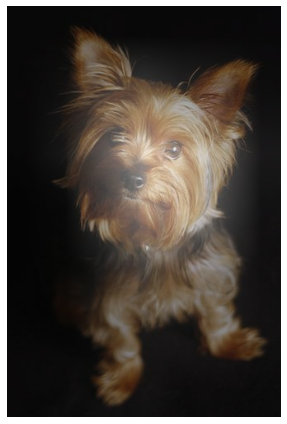

In [ ]:
blended_image = visualize_cam_on_image(cam_image_3channel, origin_image)
plt.imshow(blended_image)
plt.show()

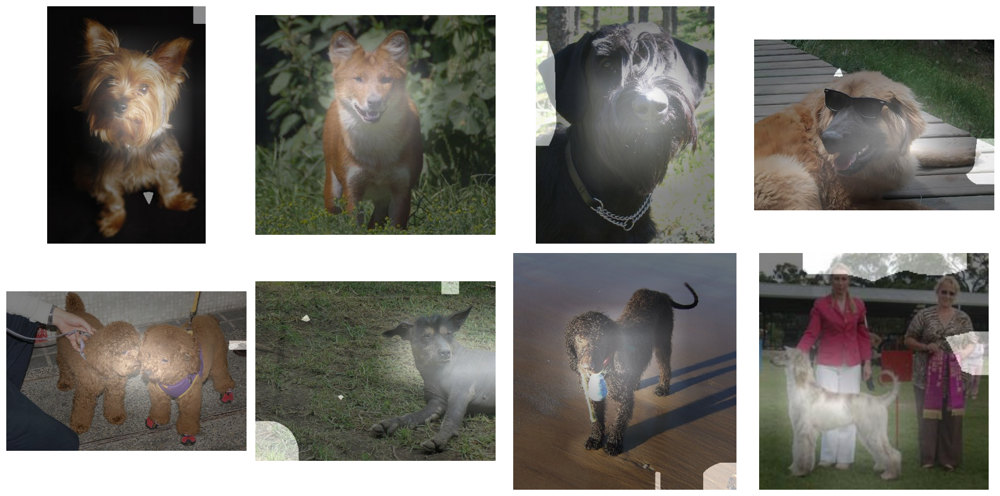

In [ ]:
fig, ax = plt.subplots(2, 4, figsize=(16, 8))
ax = ax.flatten()
data = ds_train.take(8)

for idx, item in enumerate(data):
  cam = generate_cam(cam_model, item)
  origin_image = item['image'].numpy().astype(np.uint8)
  cam_image_3channel = np.stack([cam*255]*3, axis=-1).astype(np.uint8)

  blended_image = visualize_cam_on_image(cam_image_3channel, origin_image)
  ax[idx].imshow(blended_image)
  ax[idx].axis(False)
plt.show()

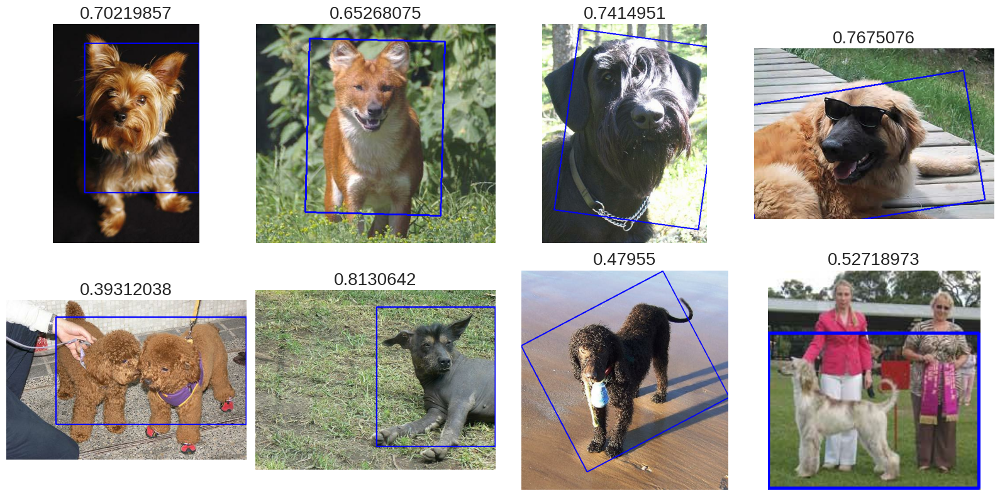

In [120]:
fig, ax = plt.subplots(2, 4, figsize=(16, 8))
ax = ax.flatten()
data = ds_train.take(8)

for idx, item in enumerate(data):
  cam_image = generate_cam(cam_model, item)
  rect = get_bbox(cam_image)
  image = copy.deepcopy(item['image'].numpy())
  image = cv2.drawContours(image, [rect], 0, (0,0,255), 2)
  pred_bbox = rect_to_minmax(rect, item['image'])
  iou = get_iou(pred_bbox, item['objects']['bbox'][0])

  ax[idx].set_title(iou.numpy(), size=20)
  ax[idx].imshow(image)
  ax[idx].axis(False)
plt.show()

## Grad CAM

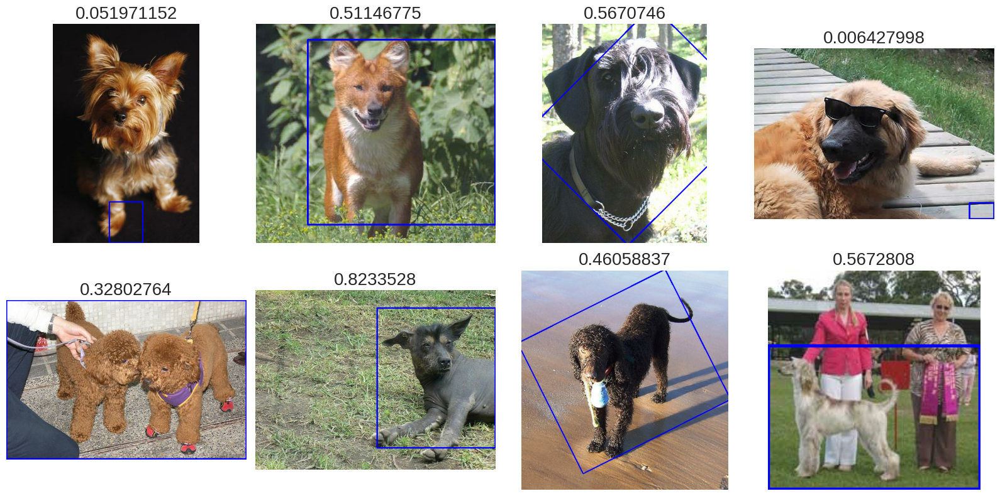

In [ ]:
# Grad CAM
# Model이 정확하게 예측하는 class는 gradient가 제대로 적용되는 반면
# 그렇지 못한 class image는 적용이 잘 되지 않는 모습이다.
fig, ax = plt.subplots(2, 4, figsize=(16, 8))
ax = ax.flatten()
data = ds_train.take(8)

for idx, item in enumerate(data):
  grad_cam_image = generate_grad_cam(cam_model, 'conv5_block3_out', item)
  rect = get_bbox(grad_cam_image)
  image = copy.deepcopy(item['image'].numpy())
  image = cv2.drawContours(image, [rect], 0, (0,0,255), 2)
  pred_bbox = rect_to_minmax(rect, item['image'])
  iou = get_iou(pred_bbox, item['objects']['bbox'][0])  

  ax[idx].set_title(iou.numpy(), size=20)
  ax[idx].imshow(image)
  ax[idx].axis(False)
plt.show()

# 코드 구현

## Import Module

In [2]:
import tensorflow as tf
from tensorflow import keras
import tensorflow_datasets as tfds

import numpy as np
import matplotlib.pyplot as plt

import copy
import cv2
from PIL import Image

from keras import Model
from keras.layers import Dense, Activation, BatchNormalization, Dropout, Flatten, Conv2D

In [24]:
import matplotlib as mpl
import warnings

%matplotlib inline

plt.style.use('seaborn')
mpl.rcParams['figure.figsize'] = (6, 6)
mpl.rcParams['axes.grid'] = False
mpl.rcParams.update({'figure.autolayout': True})

warnings.filterwarnings('ignore')

In [4]:
path_drive = '/content/drive/MyDrive/Colab Notebooks/GoingDeeper/10'

## Loading Data

In [5]:
path_ds = path_drive + '/data'
(ds_train, ds_test), info = tfds.load(
                              'stanford_dogs',
                              with_info=True,
                              split=['train', 'test'],
                              data_dir=path_ds
)

In [6]:
info

tfds.core.DatasetInfo(
    name='stanford_dogs',
    version=0.2.0,
    description='The Stanford Dogs dataset contains images of 120 breeds of dogs from around
the world. This dataset has been built using images and annotation from
ImageNet for the task of fine-grained image categorization. There are
20,580 images, out of which 12,000 are used for training and 8580 for
testing. Class labels and bounding box annotations are provided
for all the 12,000 images.',
    homepage='http://vision.stanford.edu/aditya86/ImageNetDogs/main.html',
    features=FeaturesDict({
        'image': Image(shape=(None, None, 3), dtype=tf.uint8),
        'image/filename': Text(shape=(), dtype=tf.string),
        'label': ClassLabel(shape=(), dtype=tf.int64, num_classes=120),
        'objects': Sequence({
            'bbox': BBoxFeature(shape=(4,), dtype=tf.float32),
        }),
    }),
    total_num_examples=20580,
    splits={
        'test': 8580,
        'train': 12000,
    },
    supervised_keys=('image'

In [7]:
num_classes = info.features["label"].num_classes
base_model = keras.applications.ResNet50(
                          include_top=False,
                          pooling='avg',
                          weights='imagenet',
                          input_shape=(224, 224, 3))
x = Dense(num_classes, name='yo', activation='softmax')(base_model.output)
cam_model = Model(base_model.inputs, x)

94781440/94765736 [==============================] - 1s 0us/step


## 학습된 모델 불러온 후 평가

In [ ]:
path_model = path_drive + '/data/cam_model.h5'
cam_model = tf.keras.models.load_model(path_model)

In [44]:
# 불러온 확습된 모델을 평가해서
# 새로운 모델 학습을 어느 목표 수치를 잡을 지 결정
# loss와 accuracy이 낮은 특징을 보여준다.
def resize_img(img, label):
    image = tf.image.resize(img, [224, 224])
    return image, label

ds_test = tfds.load(
                              'stanford_dogs',
                              split='test',
                              data_dir=path_ds,
                              as_supervised=True
)

ds_test = ds_test.map(resize_img)
ds_test = ds_test.batch(1)

cam_model.compile(optimizer=keras.optimizers.SGD(learning_rate=0.01), loss='sparse_categorical_crossentropy', metrics='acc')
cam_model.evaluate(ds_val_norm, steps=int(info.splits['train'].num_examples/16))

750/750 [==============================] - 42s 44ms/step - loss: 1.0372 - acc: 0.6972


[1.0372320413589478, 0.6971666812896729]

In [ ]:
# ResNet의 마지막 Conv layer output
# 7 by 7, 2048
cam_model.layers[-3].output

<KerasTensor: shape=(None, 7, 7, 2048) dtype=float32 (created by layer 'conv5_block3_out')>

In [ ]:
# 학습시킨 Dense Layer weights
cam_model.layers[-1].get_weights()

[array([[-0.0349097 ,  0.03546897,  0.00453803, ...,  0.04620327,
          0.02031208, -0.04651506],
        [-0.00840117, -0.00637474, -0.01266885, ...,  0.01376605,
         -0.03582407,  0.01403453],
        [ 0.01443218, -0.01016309, -0.00193629, ...,  0.00831807,
          0.01342232, -0.05060018],
        ...,
        [-0.0399581 , -0.00473676,  0.00507926, ..., -0.01764654,
          0.04735577, -0.02840735],
        [-0.04468514,  0.04547124,  0.0162893 , ...,  0.00314759,
          0.00023769, -0.00359975],
        [-0.02821209,  0.02734763, -0.03000677, ..., -0.04566495,
          0.00438576,  0.02354406]], dtype=float32),
 array([-2.64680339e-03, -2.34088046e-03,  2.22140094e-04, -1.81391090e-03,
        -2.52205133e-03, -5.00267744e-03, -3.64068011e-03,  4.44207602e-04,
         4.56088979e-04, -5.12022409e-04, -1.96635118e-03,  6.66617299e-04,
         1.70202926e-03, -1.46751292e-03,  2.01526494e-03, -6.03257969e-04,
         6.00879360e-03,  7.82357936e-04,  4.70258790e

In [49]:
def normalize_and_resize_img(input):
    image = tf.image.resize(input['image'], [224, 224])
    input['image'] = tf.cast(image, tf.float32) / 255.
    return input['image'], input['label']

In [50]:
# model is cam_model trained
# item is data from Dataset, non-supervised
# Ex> for item in ds_train: break
def generate_cam(model, item):
  img = copy.deepcopy(item)
  
  # img['image'] is not normalized
  height, width = img['image'].shape[:2]

  # Resize img
  img_tensor, class_idx = normalize_and_resize_img(img)

  # Extract feature map on resnet's layer whose name is 'conv5_block3_out'
  cam_model = Model(model.inputs, model.layers[-3].output)
  
  # Use calling cam_model
  # For batch dimension, expand img_tensor shape
  conv_output = cam_model(tf.expand_dims(img_tensor, 0))

  # Squeeze conv_output
  conv_output = tf.squeeze(conv_output)

  # Loading weights of Dense trained
  # get_weights()[0] means only for loading slope, not bias
  class_weights = model.layers[-1].get_weights()[0]

  cam_image = np.zeros(dtype=np.float32, shape=conv_output.shape[0:2])
  for i, w in enumerate(class_weights[:, class_idx]):
    cam_image += w * conv_output[:, :, i]
    
  cam_image /= np.max(cam_image) 
  cam_image = cam_image.numpy()
  cam_image = cv2.resize(cam_image, (width, height))

  return cam_image

In [ ]:
# Loading a image
for image in ds_train: break

In [ ]:
cam_image = generate_cam(cam_model, image)
type(cam_image), cam_image.shape

(numpy.ndarray, (500, 333))

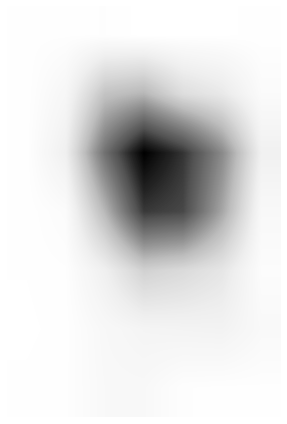

In [ ]:
plt.imshow(cam_image)
plt.show()

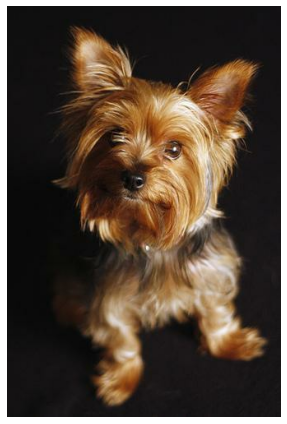

In [ ]:
# 강아지 얼굴에서 강한 활성화를 확인할 수 있다.
plt.imshow(image['image'])
plt.show()

In [ ]:
def visualize_cam_on_image(src1, src2, alpha=0.5):
    beta = (1.0 - alpha)
    merged_image = cv2.addWeighted(src1, alpha, src2, beta, 0.0)
    return merged_image
    
origin_image = image['image'].numpy().astype(np.uint8)
cam_image_3channel = np.stack([cam_image*255]*3, axis=-1).astype(np.uint8)

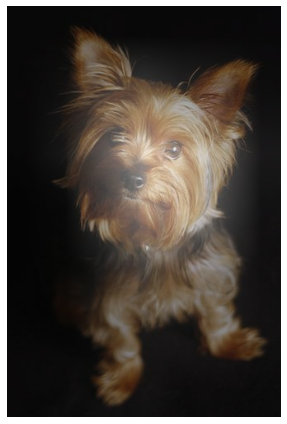

In [ ]:
blended_image = visualize_cam_on_image(cam_image_3channel, origin_image)
plt.imshow(blended_image)
plt.show()

## 이제 CAM 모델을 학습시켜보자

### 일단 데이터를 다시 불러온다.

In [8]:
path_ds = path_drive + '/data'
(ds_train, ds_val), info = tfds.load(
                              'stanford_dogs',
                              split=['train', 'test'],
                              data_dir=path_ds,
                              with_info=True
)

In [9]:
def normalize_and_resize_img(input):
    image = tf.image.resize(input['image'], [224, 224])
    input['image'] = tf.cast(image, tf.float32) / 255.
    return input['image'], input['label']

def apply_normalize_on_dataset(ds, is_test=False, batch_size=16):
    ds = ds.map(
        normalize_and_resize_img, 
        num_parallel_calls=2
    )
    ds = ds.batch(batch_size)
    if not is_test:
        ds = ds.repeat()
        ds = ds.shuffle(200)
    ds = ds.prefetch(tf.data.experimental.AUTOTUNE)
    return ds

In [10]:
ds_train_norm = apply_normalize_on_dataset(ds_train)
ds_val_norm = apply_normalize_on_dataset(ds_val)

In [12]:
num_classes = info.features["label"].num_classes
base_model = keras.applications.ResNet50(
                          include_top=False,
                          pooling='avg',
                          weights='imagenet',
                          input_shape=(224, 224, 3))
x = Dense(num_classes, name='yo', activation='softmax')(base_model.output)
cam_model = Model(base_model.inputs, x)

In [13]:
cam_model.compile(keras.optimizers.SGD(learning_rate=0.001), loss='sparse_categorical_crossentropy', metrics='acc')

In [15]:
path_check = path_drive + '/check'

check_point = keras.callbacks.ModelCheckpoint(
                  path_check,
                  save_weights_only=True
)

In [16]:
epochs=10

# dataset을 repeat()를 통해 무한히 늘렸기 때문에
# steps_per_epoch를 설정한다.
history_cam_model = cam_model.fit(
    ds_train_norm,
    steps_per_epoch=int(info.splits['train'].num_examples/16),
    validation_steps=int(info.splits['test'].num_examples/16),
    epochs=epochs,
    validation_data=ds_val_norm,
    verbose=1,
    use_multiprocessing=True,
    callbacks=[check_point]
)

Epoch 1/10
750/750 [==============================] - 132s 142ms/step - loss: 4.4083 - acc: 0.0871 - val_loss: 4.6376 - val_acc: 0.0497
Epoch 2/10
750/750 [==============================] - 102s 137ms/step - loss: 2.8445 - acc: 0.3988 - val_loss: 2.1718 - val_acc: 0.4824
Epoch 3/10
750/750 [==============================] - 101s 135ms/step - loss: 1.9211 - acc: 0.5919 - val_loss: 1.6622 - val_acc: 0.5778
Epoch 4/10
750/750 [==============================] - 103s 137ms/step - loss: 1.4080 - acc: 0.7006 - val_loss: 1.3938 - val_acc: 0.6294
Epoch 5/10
750/750 [==============================] - 101s 135ms/step - loss: 1.0717 - acc: 0.7832 - val_loss: 1.2590 - val_acc: 0.6532
Epoch 6/10
750/750 [==============================] - 102s 136ms/step - loss: 0.8423 - acc: 0.8425 - val_loss: 1.1709 - val_acc: 0.6704
Epoch 7/10
750/750 [==============================] - 105s 140ms/step - loss: 0.6718 - acc: 0.8883 - val_loss: 1.1191 - val_acc: 0.6813
Epoch 8/10
750/750 [============================

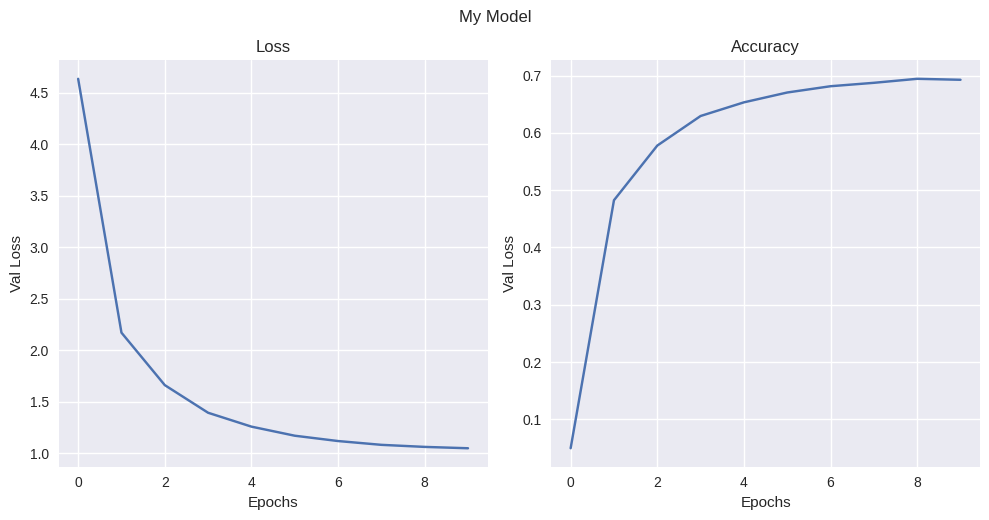

In [41]:
epochs = range(10)
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
fig.suptitle('My Model', y=1.03)

ax[0].set_title('Loss')
ax[0].plot(epochs, history_cam_model.history['val_loss'])
ax[0].axis(True)
ax[0].grid(True)
ax[0].set_xlabel("Epochs")
ax[0].set_ylabel("Val Loss")

ax[1].set_title('Accuracy')
ax[1].plot(epochs, history_cam_model.history['val_acc'])
ax[1].axis(True)
ax[1].grid(True)
ax[1].set_xlabel("Epochs")
ax[1].set_ylabel("Val Loss")
plt.show()

In [ ]:
# 참고사항
# 제공된 Model의 Loss와 Accuracy
def resize_img(img, label):
    image = tf.image.resize(img, [224, 224])
    return image, label

ds_test = tfds.load(
                              'stanford_dogs',
                              split='test',
                              data_dir=path_ds,
                              as_supervised=True
)

ds_test = ds_test.map(resize_img)
ds_test = ds_test.batch(1)

cam_model.compile(optimizer=keras.optimizers.SGD(learning_rate=0.01), loss='sparse_categorical_crossentropy', metrics='acc')
cam_model.evaluate(ds_val_norm, steps=int(info.splits['train'].num_examples/16))

750/750 [==============================] - 42s 44ms/step - loss: 1.0372 - acc: 0.6972


[1.0372320413589478, 0.6971666812896729]

### 학습한 Model Test

In [45]:
# Loading a image
for image in ds_train: break

In [51]:
cam_image = generate_cam(cam_model, image)
type(cam_image), cam_image.shape

(numpy.ndarray, (500, 333))

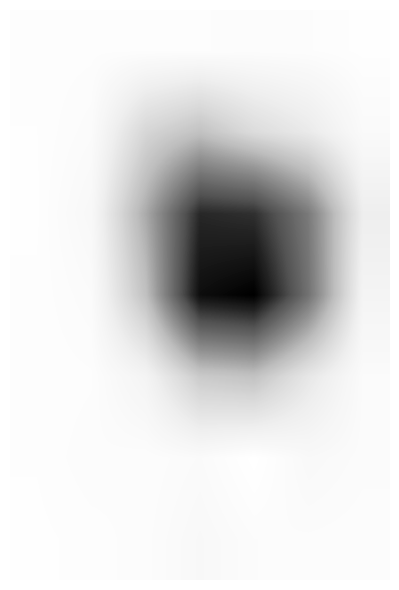

In [58]:
plt.imshow(cam_image)
plt.grid(False)
plt.axis(False)
plt.show()

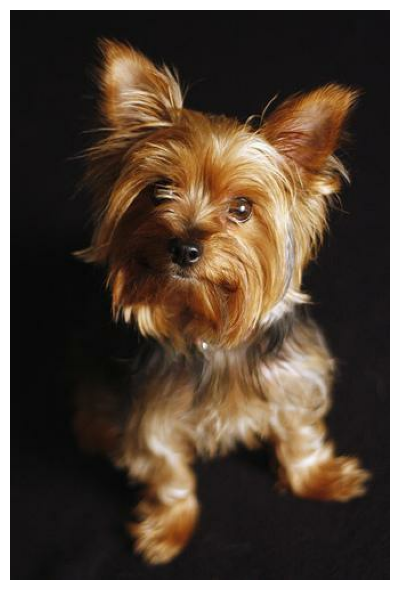

In [59]:
# 강아지 얼굴에서 강한 활성화를 확인할 수 있다.
plt.imshow(image['image'])
plt.axis(False)
plt.show()

In [60]:
def visualize_cam_on_image(src1, src2, alpha=0.5):
    beta = (1.0 - alpha)
    merged_image = cv2.addWeighted(src1, alpha, src2, beta, 0.0)
    return merged_image
    
origin_image = image['image'].numpy().astype(np.uint8)
cam_image_3channel = np.stack([cam_image*255]*3, axis=-1).astype(np.uint8)

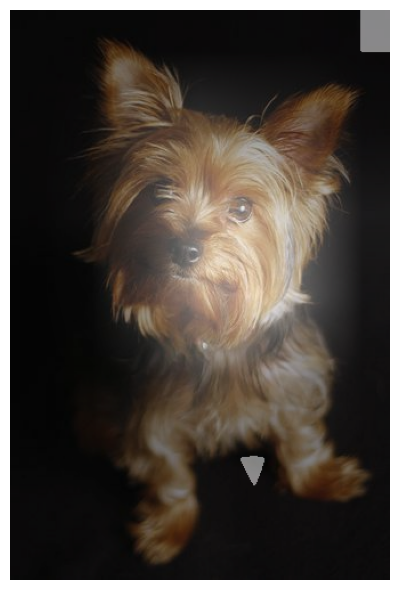

In [61]:
blended_image = visualize_cam_on_image(cam_image_3channel, origin_image)
plt.imshow(blended_image)
plt.axis(False)
plt.show()

### CAM 최종결과

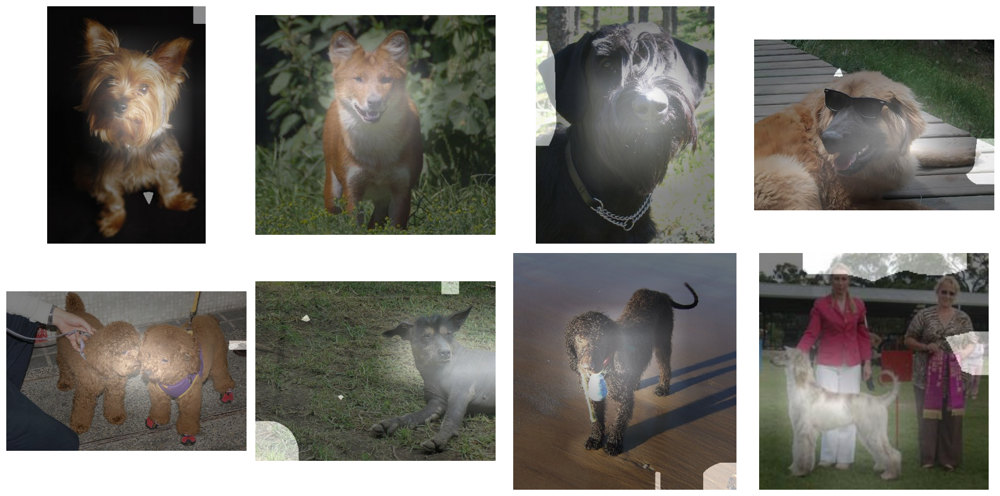

In [85]:
fig, ax = plt.subplots(2, 4, figsize=(16, 8))
ax = ax.flatten()
data = ds_train.take(8)

for idx, item in enumerate(data):
  cam = generate_cam(cam_model, item)
  origin_image = item['image'].numpy().astype(np.uint8)
  cam_image_3channel = np.stack([cam*255]*3, axis=-1).astype(np.uint8)

  blended_image = visualize_cam_on_image(cam_image_3channel, origin_image)
  ax[idx].imshow(blended_image)
  ax[idx].axis(False)
plt.show()

In [86]:
def get_bbox(cam_image, score_thresh=0.05):
    low_indicies = cam_image <= score_thresh
    cam_image[low_indicies] = 0
    cam_image = (cam_image*255).astype(np.uint8)
    
    contours,_ = cv2.findContours(cam_image, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    cnt = contours[0]
    rotated_rect = cv2.minAreaRect(cnt)
    rect = cv2.boxPoints(rotated_rect)
    rect = np.int0(rect)
    return rect

In [98]:
for image in ds_train: break
cam_image = generate_cam(cam_model, image)

In [99]:
rect = get_bbox(cam_image)
rect

array([[ 72,  45],
       [332,  45],
       [332, 385],
       [ 72, 385]])

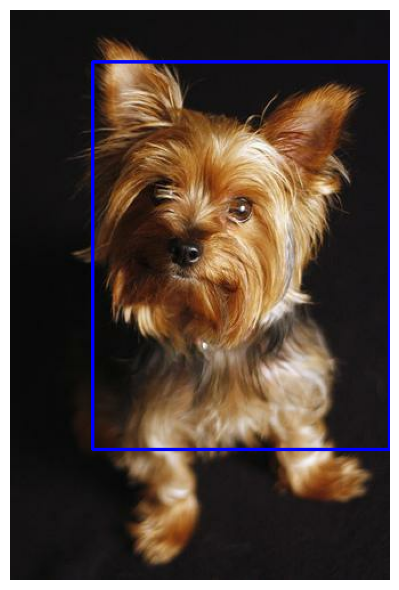

In [100]:
image = copy.deepcopy(image['image'].numpy())
image = cv2.drawContours(image, [rect], 0, (0,0,255), 2)
plt.imshow(image)
plt.axis(False)
plt.show()

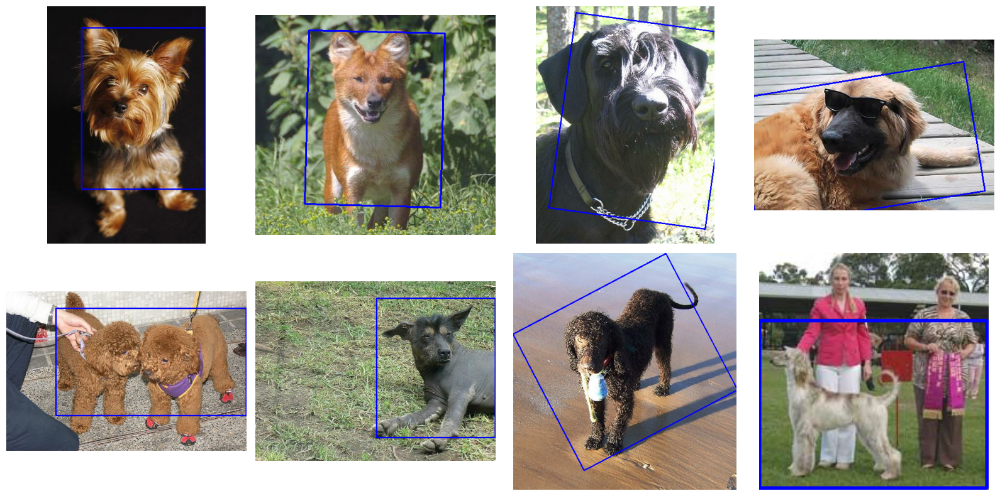

In [101]:
fig, ax = plt.subplots(2, 4, figsize=(16, 8))
ax = ax.flatten()
data = ds_train.take(8)

for idx, item in enumerate(data):
  cam_image = generate_cam(cam_model, item)
  rect = get_bbox(cam_image)
  image = copy.deepcopy(item['image'].numpy())
  image = cv2.drawContours(image, [rect], 0, (0,0,255), 2)

  ax[idx].imshow(image)
  ax[idx].axis(False)
plt.show()

In [106]:
for image in ds_train: break
cam_image = generate_cam(cam_model, image)

In [107]:
rect = get_bbox(cam_image)
rect

array([[ 72,  45],
       [332,  45],
       [332, 385],
       [ 72, 385]])

In [108]:
def rect_to_minmax(rect, image):
    bbox = [
        rect[:,1].min()/float(image.shape[0]),  #bounding box의 y_min
        rect[:,0].min()/float(image.shape[1]),  #bounding box의 x_min
        rect[:,1].max()/float(image.shape[0]), #bounding box의 y_max
        rect[:,0].max()/float(image.shape[1]) #bounding box의 x_max
    ]
    return bbox

In [109]:
def get_iou(boxA, boxB):
    y_min = max(boxA[0], boxB[0])
    x_min= max(boxA[1], boxB[1])
    y_max = min(boxA[2], boxB[2])
    x_max = min(boxA[3], boxB[3])
    
    interArea = max(0, x_max - x_min) * max(0, y_max - y_min)
    boxAArea = (boxA[2] - boxA[0]) * (boxA[3] - boxA[1])
    boxBArea = (boxB[2] - boxB[0]) * (boxB[3] - boxB[1])
    iou = interArea / float(boxAArea + boxBArea - interArea)

    return iou

In [113]:
pred_bbox = rect_to_minmax(rect, image['image'])
get_iou(pred_bbox, image['objects']['bbox'][0])

<tf.Tensor: shape=(), dtype=float32, numpy=0.70219857>

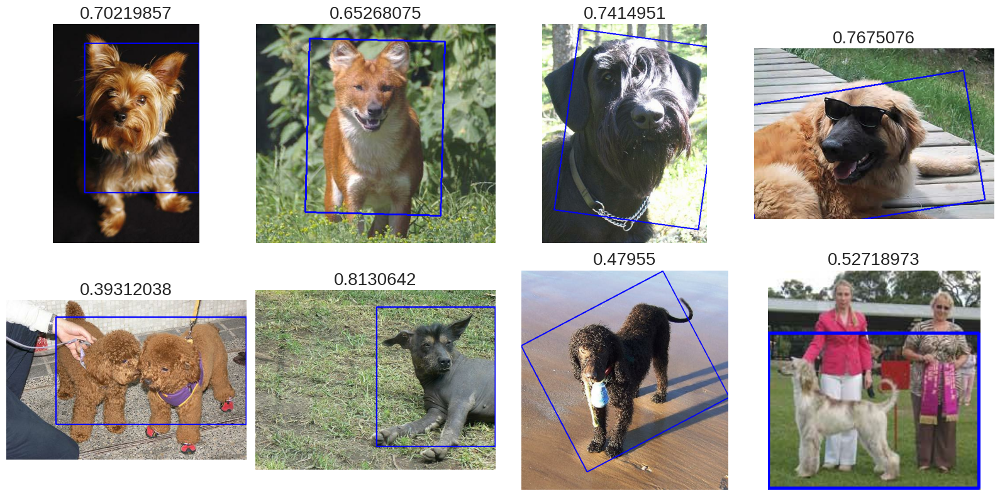

In [119]:
fig, ax = plt.subplots(2, 4, figsize=(16, 8))
ax = ax.flatten()
data = ds_train.take(8)

for idx, item in enumerate(data):
  cam_image = generate_cam(cam_model, item)
  rect = get_bbox(cam_image)
  image = copy.deepcopy(item['image'].numpy())
  image = cv2.drawContours(image, [rect], 0, (0,0,255), 2)
  pred_bbox = rect_to_minmax(rect, item['image'])
  iou = get_iou(pred_bbox, item['objects']['bbox'][0])

  ax[idx].set_title(iou.numpy(), size=20)
  ax[idx].imshow(image)
  ax[idx].axis(False)
plt.show()

## Grad-CAM

In [122]:
def generate_grad_cam(model, activation_layer, item):
    item = copy.deepcopy(item)
    width = item['image'].shape[1]
    height = item['image'].shape[0]
    img_tensor, class_idx = normalize_and_resize_img(item)
    
    # Grad cam에서도 cam과 같이 특정 레이어의 output을 필요로 하므로 모델의 input과 output을 새롭게 정의합니다.
    # 이때 원하는 레이어가 다를 수 있으니 해당 레이어의 이름으로 찾은 후 output으로 추가합니다.
    grad_model = tf.keras.models.Model([model.inputs], [model.get_layer(activation_layer).output, model.output])
    
    # Gradient를 얻기 위해 tape를 사용합니다.
    with tf.GradientTape() as tape:
        conv_output, pred = grad_model(tf.expand_dims(img_tensor, 0))
    
        loss = pred[:, class_idx] # 원하는 class(여기서는 정답으로 활용) 예측값을 얻습니다.
        output = conv_output[0] # 원하는 layer의 output을 얻습니다.
        grad_val = tape.gradient(loss, conv_output)[0] # 예측값에 따른 Layer의 gradient를 얻습니다.

    weights = np.mean(grad_val, axis=(0, 1)) # gradient의 GAP으로 weight를 구합니다.
    grad_cam_image = np.zeros(dtype=np.float32, shape=conv_output.shape[0:2])
    for k, w in enumerate(weights):
        # output의 k번째 채널과 k번째 weight를 곱하고 누적해서 class activation map을 얻습니다.
        grad_cam_image += w * output[:, :, k]
        
    grad_cam_image = tf.math.maximum(0, grad_cam_image)
    grad_cam_image /= np.max(grad_cam_image)
    grad_cam_image = grad_cam_image.numpy()
    grad_cam_image = cv2.resize(grad_cam_image, (width, height))
    return grad_cam_image

In [126]:
for image in ds_train: break
cam_image = generate_cam(cam_model, image)

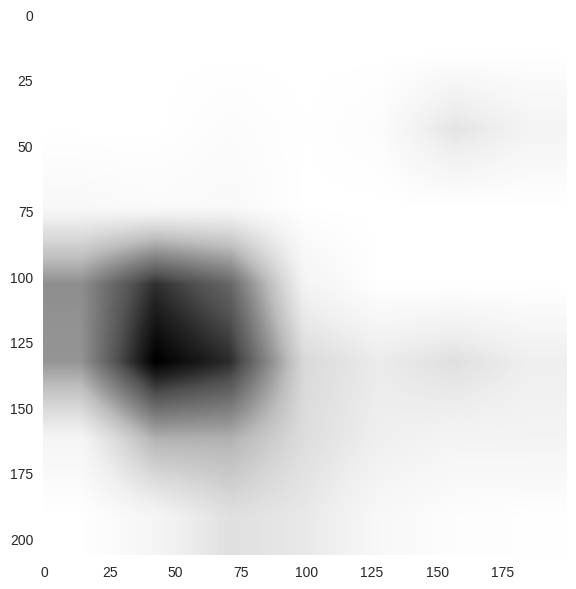

In [127]:
grad_cam_image = generate_grad_cam(cam_model, 'conv5_block3_out', item)
plt.imshow(grad_cam_image)
plt.show()

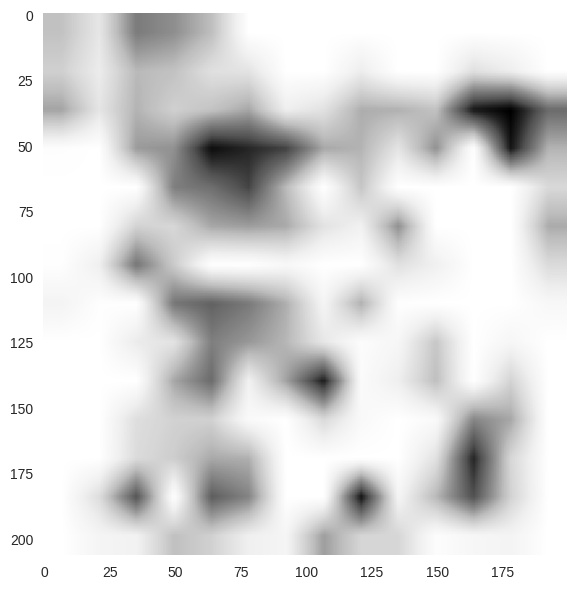

In [128]:
grad_cam_image = generate_grad_cam(cam_model, 'conv4_block3_out', item)
plt.imshow(grad_cam_image)
plt.show()

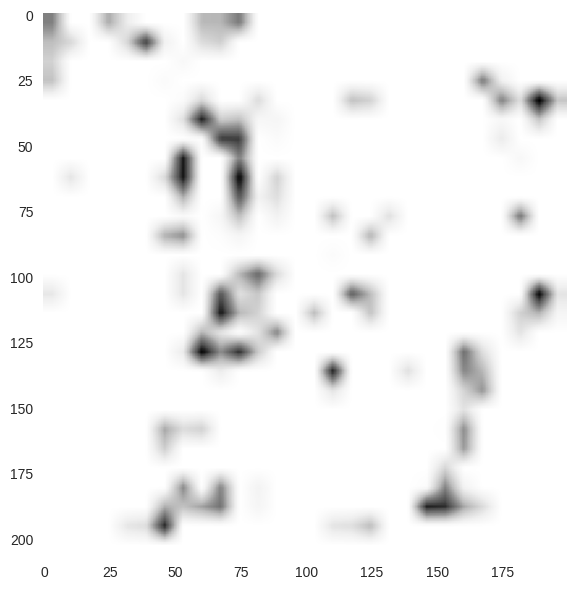

In [129]:
grad_cam_image = generate_grad_cam(cam_model, 'conv3_block3_out', item)
plt.imshow(grad_cam_image)
plt.show()

Grad CAM은 마지막 Convolution Layer이 아니더라도  
Class에 대한 Feature Map 변화율로 계산하여 위처럼 표현할 수 있지만  

input layer에 가까워 질 수록 작은 feature에 활성화되는 것을 확인할 수 있다.

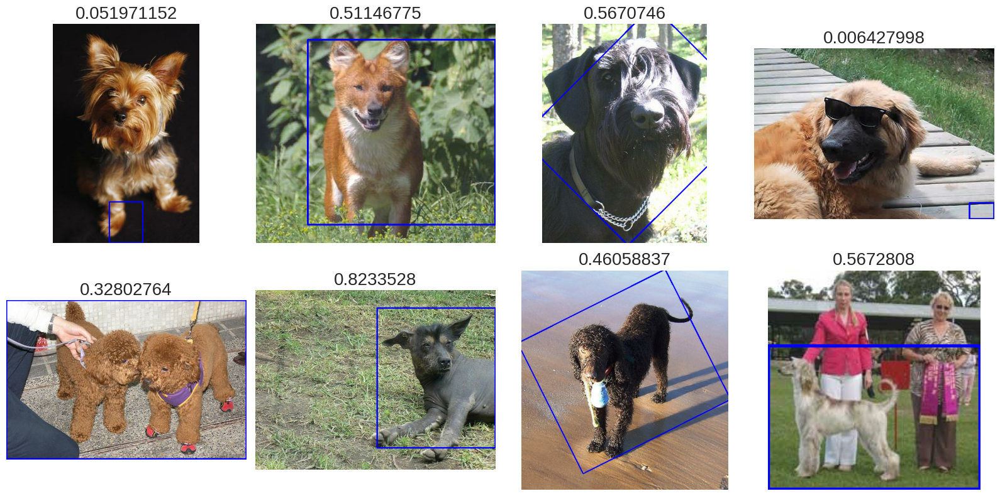

In [131]:
fig, ax = plt.subplots(2, 4, figsize=(16, 8))
ax = ax.flatten()
data = ds_train.take(8)

for idx, item in enumerate(data):
  grad_cam_image = generate_grad_cam(cam_model, 'conv5_block3_out', item)
  rect = get_bbox(grad_cam_image)
  image = copy.deepcopy(item['image'].numpy())
  image = cv2.drawContours(image, [rect], 0, (0,0,255), 2)
  pred_bbox = rect_to_minmax(rect, item['image'])
  iou = get_iou(pred_bbox, item['objects']['bbox'][0])  

  ax[idx].set_title(iou.numpy(), size=20)
  ax[idx].imshow(image)
  ax[idx].axis(False)
plt.show()

# 회고

점점 관련 API를 참고하여 필요한 것을 얻는 것에 익숙해짐을 느끼고 있다.  
코드에 반은 주어진 것을 이해하는 것으로 만족했지만  
나머지 반은 내가 생각하기에 더 효율적이고 컴팩트하게 표현하고자 했다.

Object detection에 이러한 방법이 있음을 배웠고  
솔직히, 이런게 있다는 것만 알면 될 거 같다.  
아직은 그렇다.